In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import sklearn

C:\Users\wladg\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
def add_grid(axes):
    axes.grid(color='grey', linestyle='-', linewidth=0.5, which='major', axis ='both')
    axes.grid(color='lightblue', linestyle='-', linewidth=0.5, which='minor', axis ='both')
    axes.minorticks_on()
    
def plot_equal_values_line(ax, x_min = 0, x_max = 10000, quantity = 10000, color='grey'):
    x = np.linspace(x_min, x_max, quantity)
    return ax.plot(x, x, c=color, linestyle = '--', label = 'Линия равных значений')

def plot_error_percent_lines(ax, x_min = 0, x_max = 10000, quantity = 10000, color='grey', percentage = 10):
    x = np.linspace(x_min, x_max, quantity)
    y1 = x-x*percentage/100
    y2 = x+x*percentage/100
    return (ax.plot(x, y1, c=color, linestyle = '--', label = F'Ошибка -{percentage}%'), 
            ax.plot(x, y2, c=color, linestyle = '--', label = F'Ошибка +{percentage}%'))

In [3]:
file_physical_props = './X_bp.xlsx'
file_physical_props_sheet_name='X_bp.csv'
file_results = 'X_nup.xlsx'
file_results_sheet_name='X_nup.csv'

# Читаем данные и сшиваем их в одну таблицу

In [4]:
file_physical_props_df = pd.read_excel(io=file_physical_props,
                                         engine='openpyxl',
                                         sheet_name = file_physical_props_sheet_name)

In [5]:
file_results_df = pd.read_excel(io=file_results,
                                         engine='openpyxl',
                                         sheet_name = file_results_sheet_name)

In [6]:
file_physical_props_df.rename(columns={'Unnamed: 0': 'id_phis_props'}, inplace=True)
file_physical_props_df.head(5)

,id_phis_props,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [7]:
file_results_df.rename(columns={'Unnamed: 0': 'id_results'}, inplace=True)
file_results_df.head(5)

,id_results,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,0,4.0,57.0
1,1,0,4.0,60.0
2,2,0,4.0,70.0
3,3,0,5.0,47.0
4,4,0,5.0,57.0


In [8]:
joined_df = file_results_df.join(file_physical_props_df, how='inner', lsuffix='id_results', rsuffix='id_phis_props')

In [9]:
joined_df.drop(columns = ['id_phis_props'], inplace=True)
joined_df.drop(columns = ['id_results'], inplace=True)
joined_df

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,4.000000,57.000000,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,0,4.000000,60.000000,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,0,4.000000,70.000000,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,0,5.000000,47.000000,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,0,5.000000,57.000000,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,90,9.076380,47.019770,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,90,10.565614,53.750790,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,90,4.161154,67.629684,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,90,6.313201,58.261074,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [10]:
joined_df.shape # смотрим на изначальную размерность даннных

(1023, 13)

In [11]:
joined_df.drop_duplicates() # удаляем дубликаты
joined_df.shape # повторно смотрим на размерность данных

(1023, 13)

In [12]:
joined_df.isnull().mean()*100 #проверяем на явные пропуски

Угол нашивки, град                      0.0
Шаг нашивки                             0.0
Плотность нашивки                       0.0
Соотношение матрица-наполнитель         0.0
Плотность, кг/м3                        0.0
модуль упругости, ГПа                   0.0
Количество отвердителя, м.%             0.0
Содержание эпоксидных групп,%_2         0.0
Температура вспышки, С_2                0.0
Поверхностная плотность, г/м2           0.0
Модуль упругости при растяжении, ГПа    0.0
Прочность при растяжении, МПа           0.0
Потребление смолы, г/м2                 0.0
dtype: float64

# Представляем категориальные данные угла в виде 1:0 по категориям Угол 0 и Угол 90

In [13]:
s = pd.Series(joined_df["Угол нашивки, град"])
categorical_sdf = pd.get_dummies(s)
joined_df = joined_df.join(categorical_sdf, how='inner')
joined_df.drop(columns = ['Угол нашивки, град'], inplace=True)
joined_df.rename(columns={0: 'Угол нашивки 0'}, inplace=True)
joined_df.rename(columns={90: 'Угол нашивки 90'}, inplace=True)

# Визуализируем даные в виде гистограмм и попарных сопоставлений

In [14]:
columns = joined_df.columns
print(columns)

Index(['Шаг нашивки', 'Плотность нашивки', 'Соотношение матрица-наполнитель',
       'Плотность, кг/м3', 'модуль упругости, ГПа',
       'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2',
       'Температура вспышки, С_2', 'Поверхностная плотность, г/м2',
       'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа',
       'Потребление смолы, г/м2', 'Угол нашивки 0', 'Угол нашивки 90'],
      dtype='object')


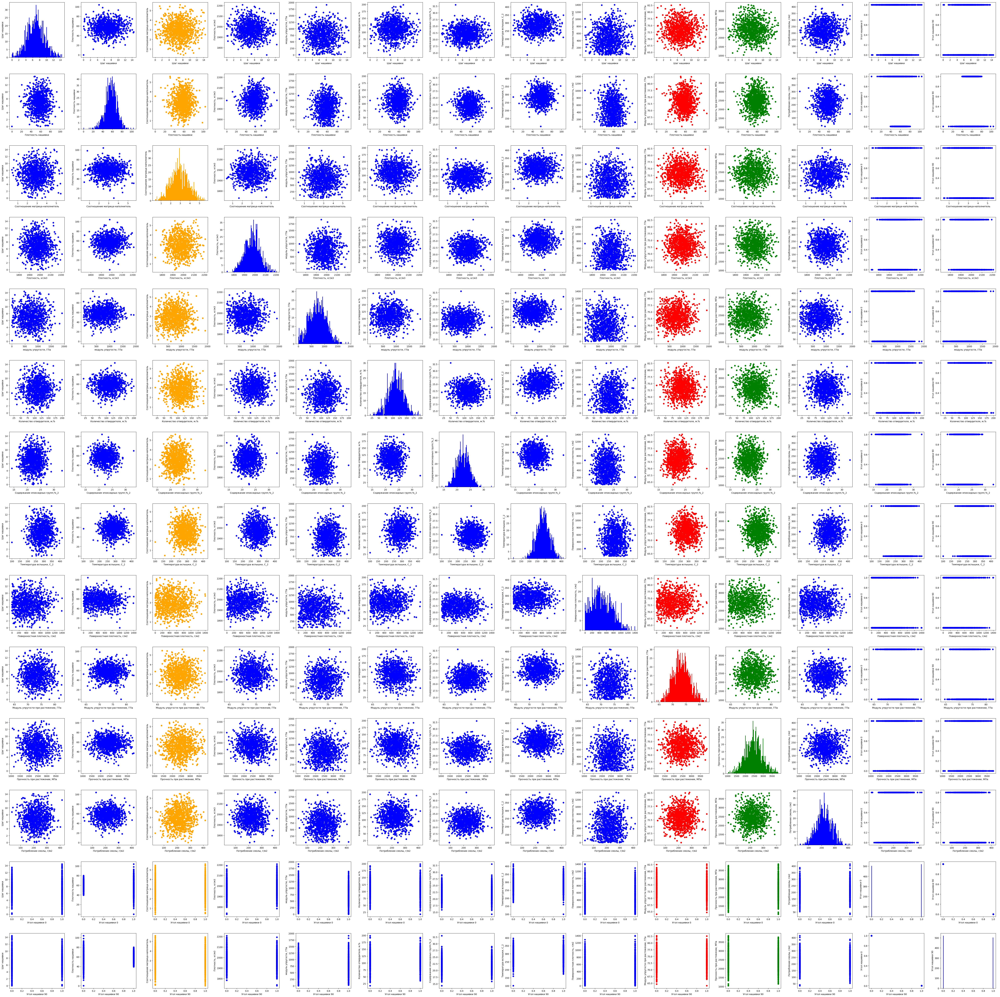

In [15]:
def show_basic_comp_hist(df, columns, file_name):
    fig, ax = plt.subplots(len(columns),len(columns), figsize=(60,60))

    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.3, hspace=0.3)

    for x, column_x in enumerate(columns):
        for y, column_y in enumerate(columns):
            if column_y == 'Модуль упругости при растяжении, ГПа':
                color = 'red'
            elif column_y == 'Прочность при растяжении, МПа':
                color = 'green'
            elif column_y == 'Соотношение матрица-наполнитель':
                color = 'orange'
            else:
                color = 'blue'

            if column_x == column_y:
                ax[x, y].hist(df[column_x], bins=100, color = color)    
                ax[x, y].set_ylabel(column_y) 
            else:
                ax[x, y].scatter(df[column_x], df[column_y], c = color)
                ax[x, y].set_xlabel(column_x)
                ax[x, y].set_ylabel(column_y)
    plt.savefig(file_name)
    
# Запускаем фукцию для исходных данных неотфильтрованных    
show_basic_comp_hist(joined_df, columns, './descriptive_graphycs_first.png')   

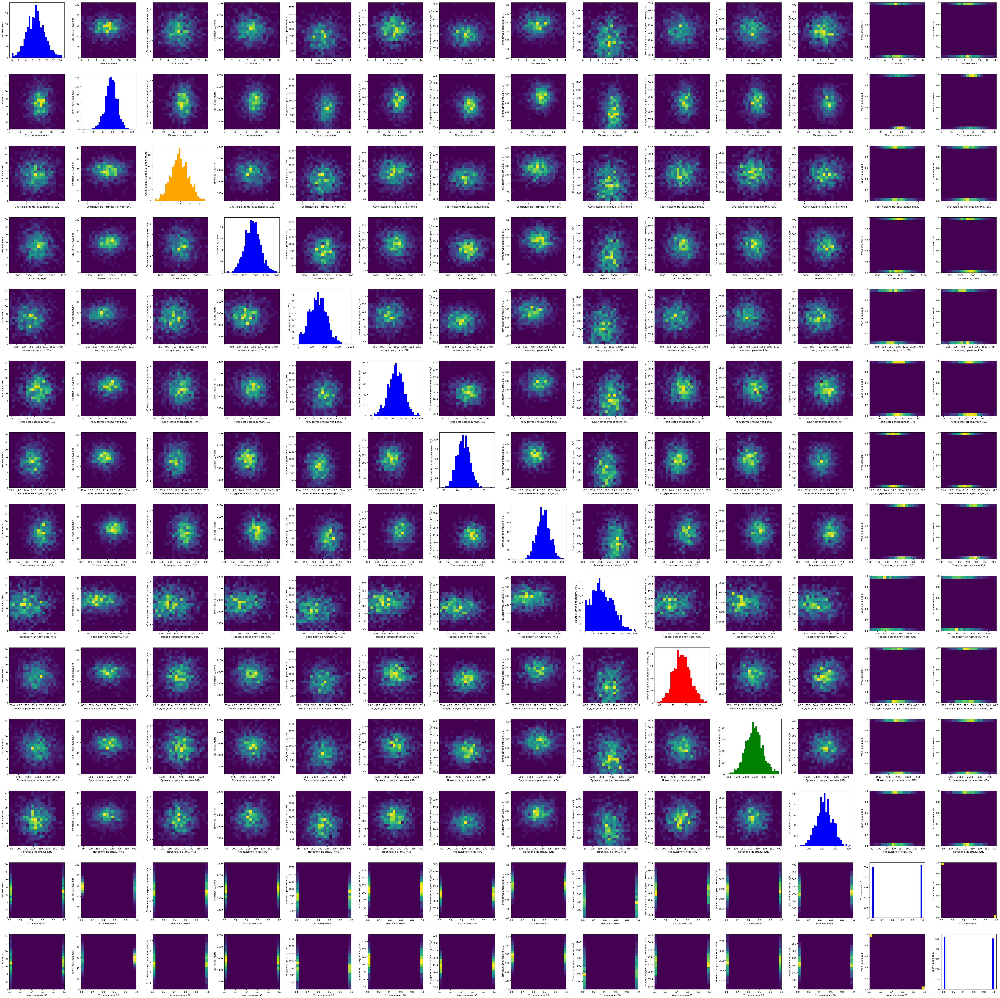

In [16]:
def show_density_comp(df, columns, file_name):
    fig, ax = plt.subplots(len(columns),len(columns), figsize=(60,60))

    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.3, hspace=0.3)

    for x, column_x in enumerate(columns):
        for y, column_y in enumerate(columns):
            if column_y == 'Модуль упругости при растяжении, ГПа':
                color = 'red'
            elif column_y == 'Прочность при растяжении, МПа':
                color = 'green'
            elif column_y == 'Соотношение матрица-наполнитель':
                color = 'orange'
            else:
                color = 'blue'

            if column_x == column_y:
                ax[x, y].hist(df[column_x], bins=30, color = color)    
                ax[x, y].set_ylabel(column_y) 
            else:
                ax[x, y].hist2d(df[column_x], df[column_y], 20)
                ax[x, y].set_xlabel(column_x)
                ax[x, y].set_ylabel(column_y)
    plt.savefig(file_name)
    
# Запускаем фукцию для исходных данных неотфильтрованных    
show_density_comp(joined_df, columns, './descriptive_graphycs_second.png')   

# Выбираем фичи и целевые показатели

In [17]:
joined_df.describe()

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,6.899222,57.153929,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.508309,0.491691
std,2.563467,12.350969,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,0.500175
min,0.000000,0.000000,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000
25%,5.080033,49.799212,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,0.000000
50%,6.916144,57.341920,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,1.000000,0.000000
75%,8.586293,64.944961,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,1.000000
max,14.440522,103.988901,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,1.000000


In [18]:
def replace_to_nan(val):
    '''Function to remove self corelation indexes'''
    if val == 1:
        val = np.nan
    return val
    
# Для этого строим корреляционную матрицу
corr_matrix_df = joined_df.corr()

for column in corr_matrix_df.columns:
    corr_matrix_df[column] = list(map(lambda x: replace_to_nan(x), corr_matrix_df[column]))
    
corr_matrix_df.describe()

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
count,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000
mean,-0.001889,0.008727,0.012144,-0.008461,0.013739,0.002283,-0.000513,0.015772,0.010256,0.005554,-0.012197,0.020143,-0.089022,-0.064824
std,0.033152,0.055524,0.027068,0.048298,0.024377,0.047896,0.023205,0.035135,0.035793,0.035232,0.039259,0.026742,0.277115,0.284299
min,-0.061015,-0.107947,-0.031073,-0.069981,-0.025417,-0.075375,-0.039073,-0.031763,-0.052299,-0.065929,-0.075375,-0.015937,-1.000000,-1.000000
25%,-0.023616,-0.004652,-0.006272,-0.035911,-0.006804,-0.035911,-0.009769,-0.009769,-0.006272,-0.017602,-0.031763,0.007446,-0.038570,-0.025417
50%,0.003487,0.011391,0.003841,-0.015937,0.023267,0.007446,-0.006804,0.020121,0.015692,0.006476,-0.009009,0.015165,-0.023003,0.020695
75%,0.023616,0.019604,0.031073,0.003841,0.031174,0.024049,0.008052,0.028414,0.038332,0.028414,0.023398,0.028602,0.015334,0.023616
max,0.038332,0.107947,0.072531,0.080304,0.056346,0.095193,0.056828,0.095193,0.055198,0.056828,0.041868,0.072531,0.068474,0.107947


In [19]:
corr_matrix_df

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
Шаг нашивки,NaN,0.003487,0.036437,-0.061015,-0.009875,0.014887,0.003022,0.025795,0.038332,-0.029468,-0.059547,0.013394,-0.023616,0.023616
Плотность нашивки,0.003487,NaN,-0.004652,0.080304,0.056346,0.017248,-0.039073,0.011391,-0.049923,0.006476,0.019604,0.012239,-0.107947,0.107947
Соотношение матрица-наполнитель,0.036437,-0.004652,NaN,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,0.031073,-0.031073
"Плотность, кг/м3",-0.061015,0.080304,0.003841,NaN,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,0.068474,-0.068474
"модуль упругости, ГПа",-0.009875,0.056346,0.031700,-0.009647,NaN,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,0.025417,-0.025417
"Количество отвердителя, м.%",0.014887,0.017248,-0.006445,-0.035911,0.024049,NaN,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,-0.038570,0.038570
"Содержание эпоксидных групп,%_2",0.003022,-0.039073,0.019766,-0.008278,-0.006804,-0.000684,NaN,-0.009769,-0.012940,0.056828,-0.023899,0.015165,-0.008052,0.008052
"Температура вспышки, С_2",0.025795,0.011391,-0.004776,-0.020695,0.031174,0.095193,-0.009769,NaN,0.020121,0.028414,-0.031763,0.059954,-0.020695,0.020695
"Поверхностная плотность, г/м2",0.038332,-0.049923,-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,NaN,0.036702,-0.003210,0.015692,-0.052299,0.052299
"Модуль упругости при растяжении, ГПа",-0.029468,0.006476,-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,NaN,-0.009009,0.050938,-0.023003,0.023003


In [20]:
key1 = ['Модуль упругости при растяжении, ГПа']
key2 = ['Прочность при растяжении, МПа']

In [21]:
# Коэффициенты парной корреляции между величинами
corr_matrix_df[key1[0]]

Шаг нашивки                            -0.029468
Плотность нашивки                       0.006476
Соотношение матрица-наполнитель        -0.008411
Плотность, кг/м3                       -0.017602
модуль упругости, ГПа                   0.023267
Количество отвердителя, м.%            -0.065929
Содержание эпоксидных групп,%_2         0.056828
Температура вспышки, С_2                0.028414
Поверхностная плотность, г/м2           0.036702
Модуль упругости при растяжении, ГПа         NaN
Прочность при растяжении, МПа          -0.009009
Потребление смолы, г/м2                 0.050938
Угол нашивки 0                         -0.023003
Угол нашивки 90                         0.023003
Name: Модуль упругости при растяжении, ГПа, dtype: float64

In [22]:
# Коэффициенты парной корреляции между величинами
corr_matrix_df[key2[0]]

Шаг нашивки                            -0.059547
Плотность нашивки                       0.019604
Соотношение матрица-наполнитель         0.024148
Плотность, кг/м3                       -0.069981
модуль упругости, ГПа                   0.041868
Количество отвердителя, м.%            -0.075375
Содержание эпоксидных групп,%_2        -0.023899
Температура вспышки, С_2               -0.031763
Поверхностная плотность, г/м2          -0.003210
Модуль упругости при растяжении, ГПа   -0.009009
Прочность при растяжении, МПа                NaN
Потребление смолы, г/м2                 0.028602
Угол нашивки 0                         -0.023398
Угол нашивки 90                         0.023398
Name: Прочность при растяжении, МПа, dtype: float64

# Избавляемся от outlier (выбросов) удаляя эти строки, а также от вероятно ошибочных значений

In [23]:
joined_df_prep = joined_df.copy() # Делаем копию датафрейма

# удаляем строку содержащую нулевой шаг нашивки и нулевую плотность нашивки (образец №19)
joined_df_prep = joined_df_prep[joined_df_prep['Шаг нашивки'] != 0]

def quantiles_filter(df, column_name):
    'Replace outliers by 0.01 and 0.99 quantile values'  
    def replace_min_max(x, min_quan, max_quan):
        if x < min_quan:
            x = min_quan
        elif x > max_quan:
            x = max_quan
        return x
    
    # Пользуемся правилом 3-х сигм что 99.73 % значений находятся в диапазоне [μ−3σ;μ+3σ]
    # Тоесть с кажддого края отсекаем по 0.1% значений которые вероятнее всего будут являтся выбросами
    min_quan = df[column_name].quantile(0.001)
    max_quan = df[column_name].quantile(0.999)
    
    df[column_name] = list(map(lambda x: replace_min_max(x, min_quan, max_quan), df[column_name]))

def quantiles_filter_drop(df, column_name):
    'drops_rows_with_outliers'
    min_quan = df[column_name].quantile(0.001)
    max_quan = df[column_name].quantile(0.999)
    
    df = df[df[column_name] > min_quan]
    df = df[df[column_name] < max_quan]
    
    return df
       
for column in columns:
    if ((column != 'Угол нашивки 0') and (column != 'Угол нашивки 90')): 
        joined_df_prep = quantiles_filter_drop(joined_df_prep, column)

In [24]:
joined_df_prep.shape

(986, 14)

In [25]:
joined_df_prep.describe()

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
count,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000
mean,6.908357,57.247059,2.937188,1974.705810,739.171425,110.843133,22.240580,286.097853,481.162011,73.325515,2467.167096,218.017637,0.501014,0.498986
std,2.527353,11.940570,0.902029,72.152307,326.203111,27.693702,2.379803,40.008451,279.339159,3.096588,479.769773,58.894184,0.500253,0.500253
min,0.239660,17.934408,0.547391,1784.482245,9.986210,32.019222,15.695894,173.484920,1.668002,64.696400,1071.123751,41.048278,0.000000,0.000000
25%,5.114602,50.003914,2.325742,1923.774940,501.560124,92.619058,20.611918,259.315232,267.142495,71.241213,2136.259145,179.604490,0.000000,0.000000
50%,6.922196,57.534784,2.914143,1977.258043,740.350683,110.713994,22.228401,285.922290,450.869535,73.259230,2457.959767,218.250769,1.000000,0.000000
75%,8.586122,64.959026,3.555989,2020.259524,957.391294,129.799954,23.971615,313.012786,691.051864,75.338920,2760.983489,257.127133,1.000000,1.000000
max,14.051383,92.963492,5.452959,2192.297637,1649.415706,192.334469,28.955094,403.652861,1391.032409,82.525773,3817.269484,386.903431,1.000000,1.000000


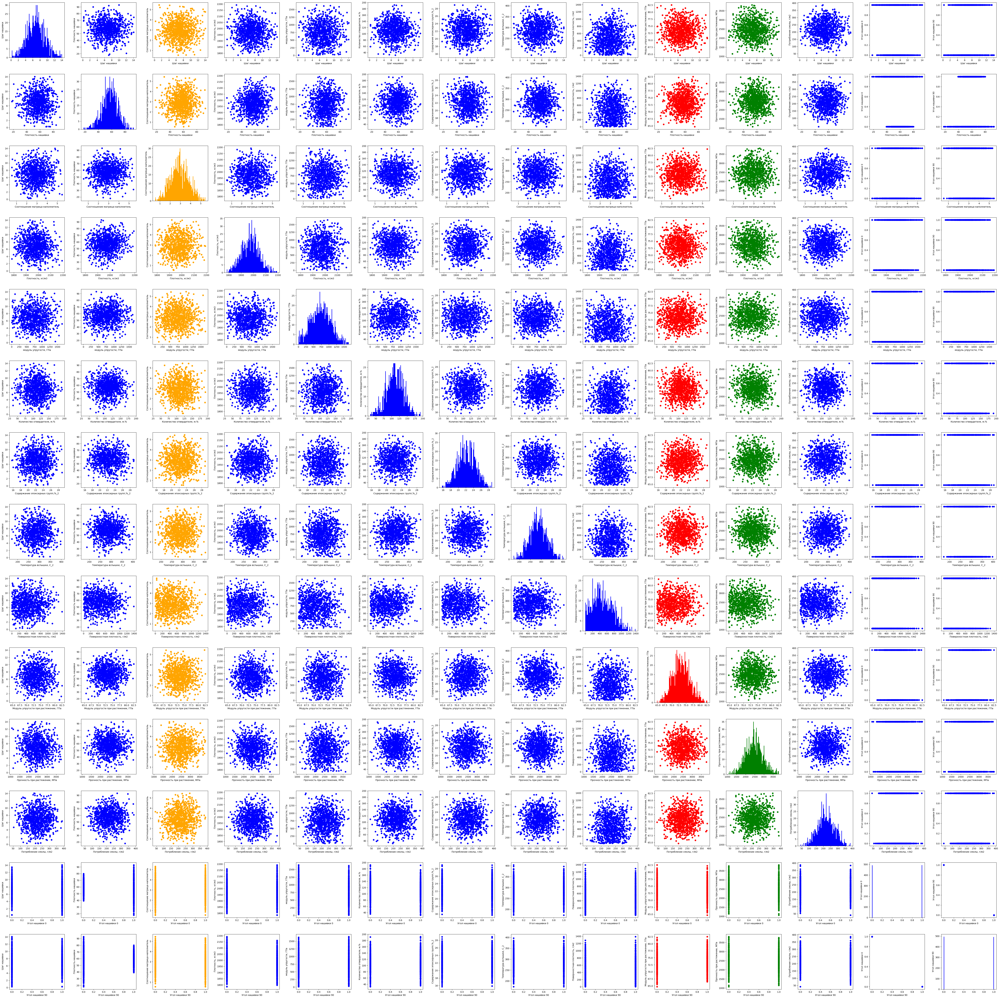

In [26]:
# Запускаем фукцию для исходных данных подготовленных
show_basic_comp_hist(joined_df_prep, columns, './descriptive_graphycs_first_prepared.png') 

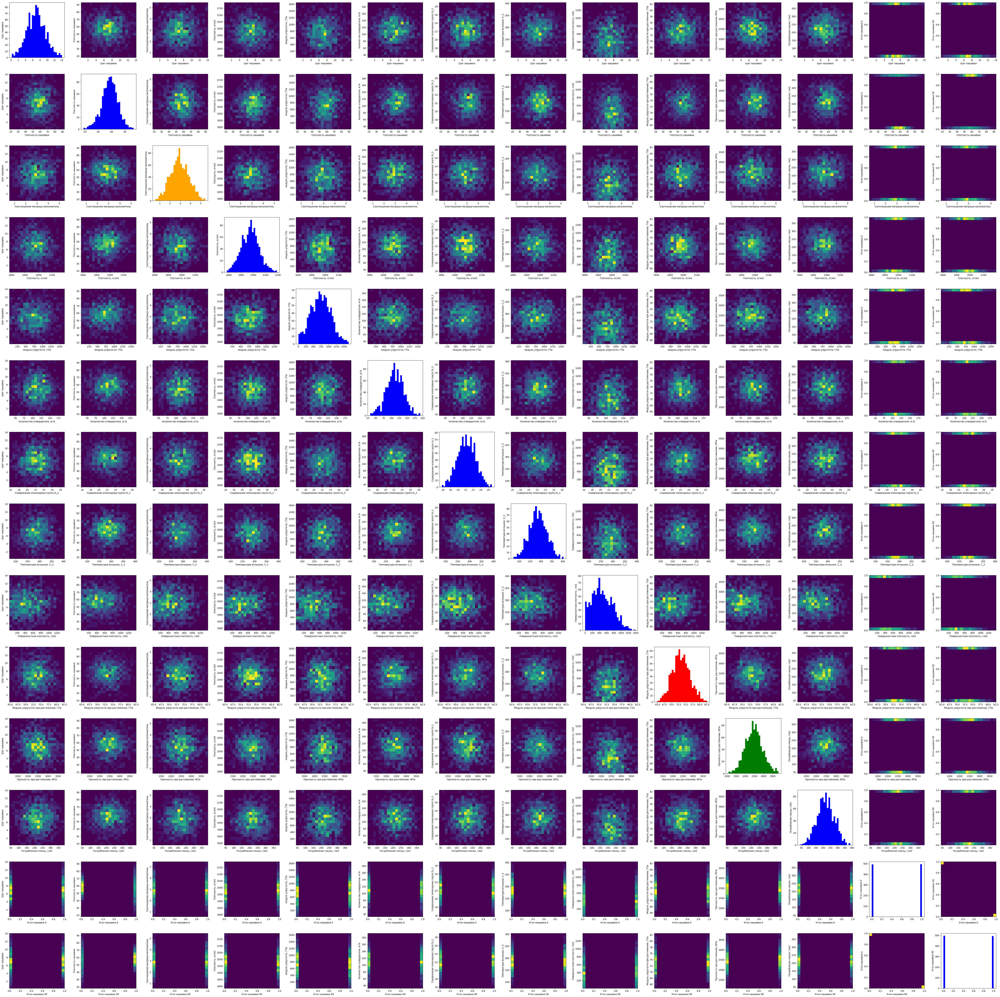

In [27]:
# Запускаем фукцию для исходных данных неотфильтрованных    
show_density_comp(joined_df_prep, columns, './descriptive_graphycs_second_prepared.png')

In [28]:
# Для этого строим корреляционную матрицу
corr_matrix_df_prep = joined_df_prep.corr()

for column in corr_matrix_df_prep.columns:
    corr_matrix_df_prep[column] = list(map(lambda x: replace_to_nan(x), corr_matrix_df_prep[column]))
    
corr_matrix_df_prep.describe()

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
count,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000
mean,-0.003538,0.015484,0.014355,-0.007419,0.013909,0.003712,0.002887,0.012793,0.010735,0.007567,-0.011937,0.019362,-0.088546,-0.065300
std,0.032535,0.056714,0.027476,0.048849,0.029820,0.043690,0.024301,0.030372,0.035434,0.036938,0.039079,0.024452,0.277174,0.284077
min,-0.065236,-0.105217,-0.039027,-0.085396,-0.038415,-0.062388,-0.036063,-0.026299,-0.053608,-0.062388,-0.085396,-0.016112,-1.000000,-1.000000
25%,-0.020044,-0.010627,-0.004848,-0.032669,-0.006989,-0.032669,-0.012017,-0.009041,-0.015852,-0.014920,-0.022762,0.003854,-0.038268,-0.038415
50%,0.000125,0.019462,0.019462,-0.014920,0.013146,0.009957,-0.000839,0.013302,0.014072,0.013146,-0.015852,0.014072,-0.019975,0.013302
75%,0.020044,0.034403,0.036673,-0.003385,0.031527,0.031527,0.011102,0.026746,0.043368,0.033526,0.024875,0.031541,0.011067,0.033526
max,0.043368,0.105217,0.061437,0.091560,0.073905,0.084183,0.057844,0.084183,0.053608,0.058816,0.031541,0.061437,0.055434,0.105217


In [29]:
corr_matrix_df_prep

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
Шаг нашивки,NaN,-0.010627,0.040290,-0.048879,0.000125,-0.011438,0.020721,0.015628,0.043368,-0.031503,-0.065236,0.001556,-0.020044,0.020044
Плотность нашивки,-0.010627,NaN,0.019462,0.091560,0.073905,0.021695,-0.036063,-0.009041,-0.031501,0.034403,0.030065,0.017439,-0.105217,0.105217
Соотношение матрица-наполнитель,0.040290,0.019462,NaN,-0.003385,0.036673,-0.005729,0.028356,-0.008740,-0.001780,-0.004848,0.024875,0.061437,0.039027,-0.039027
"Плотность, кг/м3",-0.048879,0.091560,-0.003385,NaN,-0.006989,-0.032669,-0.006261,-0.026299,0.052900,-0.014920,-0.085396,-0.016112,0.055434,-0.055434
"модуль упругости, ГПа",0.000125,0.073905,0.036673,-0.006989,NaN,0.031527,-0.012233,0.029790,-0.017932,0.013146,0.028958,0.003854,0.038415,-0.038415
"Количество отвердителя, м.%",-0.011438,0.021695,-0.005729,-0.032669,0.031527,NaN,0.009957,0.084183,0.050443,-0.062388,-0.058298,0.020969,-0.038268,0.038268
"Содержание эпоксидных групп,%_2",0.020721,-0.036063,0.028356,-0.006261,-0.012233,0.009957,NaN,-0.000839,-0.012017,0.057844,-0.022762,0.010825,-0.011102,0.011102
"Температура вспышки, С_2",0.015628,-0.009041,-0.008740,-0.026299,0.029790,0.084183,-0.000839,NaN,0.026746,0.023678,-0.016114,0.047316,-0.013302,0.013302
"Поверхностная плотность, г/м2",0.043368,-0.031501,-0.001780,0.052900,-0.017932,0.050443,-0.012017,0.026746,NaN,0.031105,-0.015852,0.014072,-0.053608,0.053608
"Модуль упругости при растяжении, ГПа",-0.031503,0.034403,-0.004848,-0.014920,0.013146,-0.062388,0.057844,0.023678,0.031105,NaN,-0.006965,0.058816,-0.033526,0.033526


In [30]:
# Коэффициенты парной корреляции между величинами
corr_matrix_df_prep[key1[0]]

Шаг нашивки                            -0.031503
Плотность нашивки                       0.034403
Соотношение матрица-наполнитель        -0.004848
Плотность, кг/м3                       -0.014920
модуль упругости, ГПа                   0.013146
Количество отвердителя, м.%            -0.062388
Содержание эпоксидных групп,%_2         0.057844
Температура вспышки, С_2                0.023678
Поверхностная плотность, г/м2           0.031105
Модуль упругости при растяжении, ГПа         NaN
Прочность при растяжении, МПа          -0.006965
Потребление смолы, г/м2                 0.058816
Угол нашивки 0                         -0.033526
Угол нашивки 90                         0.033526
Name: Модуль упругости при растяжении, ГПа, dtype: float64

In [31]:
# Коэффициенты парной корреляции между величинами
corr_matrix_df_prep[key2[0]]

Шаг нашивки                            -0.065236
Плотность нашивки                       0.030065
Соотношение матрица-наполнитель         0.024875
Плотность, кг/м3                       -0.085396
модуль упругости, ГПа                   0.028958
Количество отвердителя, м.%            -0.058298
Содержание эпоксидных групп,%_2        -0.022762
Температура вспышки, С_2               -0.016114
Поверхностная плотность, г/м2          -0.015852
Модуль упругости при растяжении, ГПа   -0.006965
Прочность при растяжении, МПа                NaN
Потребление смолы, г/м2                 0.031541
Угол нашивки 0                         -0.019975
Угол нашивки 90                         0.019975
Name: Прочность при растяжении, МПа, dtype: float64

# По корреляционным матрицам и визуально видим что какого то конкретного показателя влияющего на зависимые параметры не наблюдается поэтому для обучения используем все 11 независимых параметров

In [32]:
features1_all = ['Шаг нашивки',
             'Плотность нашивки',
             'Соотношение матрица-наполнитель',
             'Плотность, кг/м3',
             'модуль упругости, ГПа',
             'Количество отвердителя, м.%',
             'Содержание эпоксидных групп,%_2', 
             'Температура вспышки, С_2',
             'Поверхностная плотность, г/м2',
             'Потребление смолы, г/м2',
             'Угол нашивки 0',
             'Угол нашивки 90']

features2_all = ['Шаг нашивки',
             'Плотность нашивки',
             'Соотношение матрица-наполнитель',
             'Плотность, кг/м3',
             'модуль упругости, ГПа',
             'Количество отвердителя, м.%',
             'Содержание эпоксидных групп,%_2', 
             'Температура вспышки, С_2',
             'Поверхностная плотность, г/м2',
             'Потребление смолы, г/м2',
             'Угол нашивки 0',
             'Угол нашивки 90']

features1 = ['Шаг нашивки',
             'Плотность нашивки',
             'Соотношение матрица-наполнитель',
             'Плотность, кг/м3',
             'модуль упругости, ГПа',
             'Количество отвердителя, м.%',
             'Содержание эпоксидных групп,%_2', 
             'Температура вспышки, С_2',
             'Поверхностная плотность, г/м2',
             'Потребление смолы, г/м2',
             'Угол нашивки 0',
             'Угол нашивки 90']

features2 = ['Шаг нашивки',
             'Плотность нашивки',
             'Соотношение матрица-наполнитель',
             'Плотность, кг/м3',
             'модуль упругости, ГПа',
             'Количество отвердителя, м.%',
             'Содержание эпоксидных групп,%_2', 
             'Температура вспышки, С_2',
             'Поверхностная плотность, г/м2',
             'Потребление смолы, г/м2',
             'Угол нашивки 0',
             'Угол нашивки 90']

X1 = joined_df_prep[features1].values
X2 = joined_df_prep[features2].values
y1 = joined_df_prep[key1].values
y2 = joined_df_prep[key2].values

# Смотрим как выглядит сет после нормализации

In [33]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
X_train, X_test, y_train, y_test = train_test_split(X1, y1, random_state=101, test_size=.3)
# Масштабируем входные данные
sc = MinMaxScaler()
X_train = sc.fit_transform(X_train)

X_test = sc.transform(X_test)

df = pd.DataFrame(X_train, columns = features1)

df.describe()


,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
count,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000
mean,0.478798,0.539125,0.484601,0.472775,0.459780,0.496215,0.497345,0.503854,0.365334,0.514768,0.507246,0.492754
std,0.188285,0.166829,0.183805,0.180036,0.203774,0.168076,0.179122,0.180250,0.212140,0.172947,0.500310,0.500310
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.343276,0.429523,0.359782,0.342600,0.308903,0.383514,0.375325,0.389904,0.201694,0.399565,0.000000,0.000000
50%,0.481609,0.540354,0.480100,0.481218,0.461068,0.496779,0.492291,0.505382,0.346900,0.515910,1.000000,0.000000
75%,0.603327,0.651118,0.612323,0.586254,0.605379,0.614146,0.627962,0.624171,0.522226,0.626424,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [34]:
X_train = sc.transform(X_test)
df = pd.DataFrame(X_test, columns = features1)
df.describe()

,Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2",Угол нашивки 0,Угол нашивки 90
count,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000,296.000000
mean,0.488587,0.535363,0.491691,0.451691,0.439987,0.494308,0.484856,0.504528,0.389405,0.504504,0.486486,0.513514
std,0.171487,0.174434,0.184779,0.168825,0.202178,0.187799,0.180323,0.176618,0.227542,0.163977,0.500664,0.500664
min,-0.002111,-0.018635,-0.000840,0.042810,-0.000827,0.010092,0.026629,0.136520,0.007775,0.036144,0.000000,0.000000
25%,0.369592,0.442706,0.369837,0.337890,0.302920,0.375154,0.350695,0.380704,0.218158,0.403469,0.000000,0.000000
50%,0.485340,0.545100,0.485730,0.454618,0.434094,0.492485,0.492839,0.493402,0.354900,0.499603,0.000000,1.000000
75%,0.603854,0.638727,0.613379,0.560627,0.568553,0.620739,0.620833,0.624946,0.551098,0.616502,1.000000,1.000000
max,0.976856,1.043707,0.967945,0.950834,1.021399,1.008058,0.952476,1.030234,1.079517,0.882531,1.000000,1.000000


# Тестируем алгоритм Ближайших соседних точек для первого и второго параметра

In [35]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

def k_n_eighbors_regressor_alg_testing(X, y, k_list):
    # Разбиваем на обучающую и тестовую выборку
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=101, test_size=.3)
    
    # Делайем плоскими входные данные так изначально они имеют размерность (y,1) преобразуем ее к (y,)
    y_test = y_test.ravel()
    y_train = y_train.ravel()
    
    # Масштабируем входные данные
    sc = MinMaxScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
                                                        
    train_scores = []
    test_scores = []
    
    for k in k_list:
        # задаем модель
        model =  KNeighborsRegressor(n_neighbors=k)

        # Инициализируем модель и обучаем ее
        model.fit(X_train, y_train)

        # Смотрим на метрики
        train_scores.append(model.score(X_train, y_train))
        test_scores.append(model.score(X_test, y_test))                                                    
    
    # Plot
    fig, ax = plt.subplots()
    
    ax.plot(k_list, train_scores, label='Training Accuracy', color='red')
    ax.plot(k_list, test_scores, label='Testing Accuracy', color='black')

    ax.set(title= 'k-NN with Different Values for k',
           xlabel='Number of Neighbors',
           ylabel='Accuracy')
    
    ax.legend()                                             

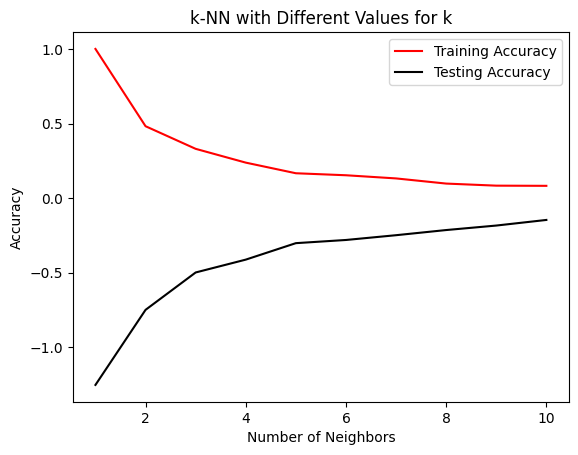

In [36]:
X1 = joined_df_prep[features1].values
y1 = joined_df_prep[key1].values

k_list = range(1,11)                                                                                                       
k_n_eighbors_regressor_alg_testing(X1, y1, k_list)

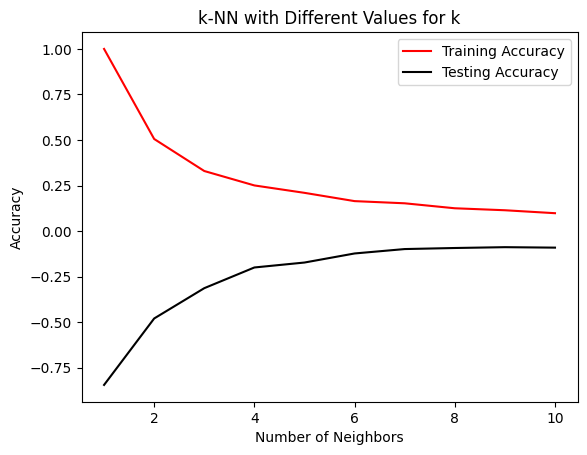

In [37]:
k_list = range(1,11)                                                                                                       
k_n_eighbors_regressor_alg_testing(X2, y2, k_list)

# Тестируем алгоритм случайного леса для первого параметра

In [38]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error as RMSE
from sklearn.metrics import mean_absolute_error as MAE

def random_forest_regressor_test(X, y):
    # Разбиваем на обучающую и тестовую выборку
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=101, test_size=.3)
    
    # Делайем плоскими входные данные так изначально они имеют размерность (y,1) преобразуем ее к (y,)
    y_test = y_test.ravel()
    y_train = y_train.ravel()
    
    # Масштабируем входные данные
    sc = MinMaxScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
    
    # задаем грид тестирования модели
    grid = { 
    'n_estimators': [50,100,200,300,400],
    'max_features': ['sqrt','log2'],
    'max_depth' : [3,4,5,6,7],
    'random_state' : [18]
    }
    
    # Выводим время начала тестирования
    print(datetime.now())
    ## Grid Search function
    CV_rfr = GridSearchCV(estimator=RandomForestRegressor(), param_grid=grid, cv=5)
    CV_rfr.fit(X_train, y_train)
    
    #Выводим параметры лучшей модели
    print(CV_rfr.best_params_)

    # Выводим время завершения тестирования
    print(datetime.now())
    
def rf_metrics(X, y, max_depth, max_features, n_estimators, random_state):
    # Разбиваем на обучающую и тестовую выборку
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=101, test_size=.3)
    
    # Делайем плоскими входные данные так изначально они имеют размерность (y,1) преобразуем ее к (y,)
    y_test = y_test.ravel()
    y_train = y_train.ravel()
    
    # Масштабируем входные данные
    sc = MinMaxScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
    # Смотрим на метрики
    model= RandomForestRegressor(max_depth = max_depth, max_features = max_features, n_estimators = n_estimators, random_state = random_state)
    model.fit(X_train, y_train)
    print('R2 для тренировочной выборки:', model.score(X_train, y_train))
    print('RMSE для тренировочной выборки:', RMSE(y_train, model.predict(X_train)))
    print('MAE для тренировочной выборки:', MAE(y_train, model.predict(X_train)))    
    print('R2 для тестовой выборки:', model.score(X_test, y_test))
    print('RMSE для тестовой выборки:', RMSE(y_test, model.predict(X_test)))
    print('MA для тестовой выборки:', MAE(y_test, model.predict(X_test)))
    
    

In [39]:
random_forest_regressor_test(X1, y1)

2022-12-14 13:07:36.255140
{'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 300, 'random_state': 18}
2022-12-14 13:08:41.149559


In [40]:
rf_metrics(X1, y1, max_depth = 3, max_features = 'sqrt', n_estimators = 300, random_state = 18)

R2 для тренировочной выборки: 0.08511785005848982
RMSE для тренировочной выборки: 8.935955440272759
MAE для тренировочной выборки: 2.423681923687677
R2 для тестовой выборки: -0.00625521250103267
RMSE для тестовой выборки: 9.196127765603928
MA для тестовой выборки: 2.4023308166368547


In [41]:
random_forest_regressor_test(X2, y2)

2022-12-14 13:08:41.717639
{'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 200, 'random_state': 18}
2022-12-14 13:09:51.301465


In [42]:
rf_metrics(X2, y2, max_depth = 3, max_features = 'sqrt', n_estimators = 200, random_state = 18)

R2 для тренировочной выборки: 0.09813348925880538
RMSE для тренировочной выборки: 207413.68089602175
MAE для тренировочной выборки: 361.72042987873874
R2 для тестовой выборки: -0.019362177837397798
RMSE для тестовой выборки: 234309.11107796265
MA для тестовой выборки: 385.0556341345449


# Пишем функции  1) для обучения и верификации 2) Для визуализации результатов

In [43]:
"""
models = [RandomForestRegressor(n_estimators=100, max_features ='sqrt'), # случайный лес
          KNeighborsRegressor(n_neighbors=6), # метод ближайших соседей
          MLPRegressor(random_state=1, max_iter=5555, hidden_layer_sizes = (120, 100, 50, 10)) нейронная сеть
"""

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.metrics import mean_squared_error as RMSE
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import r2_score

def train_and_validate_model(X, y, model_type, neuron_model = (100), n_estimators=300):
    # Разбиваем на обучающую и тестовую выборку
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=101, test_size=.3)

    # Делайем плоскими входные данные так изначально они имеют размерность (y,1) преобразуем ее к (y,)
    y_test = y_test.ravel()
    y_train = y_train.ravel()
    
    if model_type != 'MLPRegressor':
       neuron_model = ''
    pass

    if model_type == 'MLPRegressor':
        model = MLPRegressor(random_state=1, max_iter=7000, hidden_layer_sizes = neuron_model, activation="relu")
    elif model_type == 'RandomForestRegressor':
        model = RandomForestRegressor(max_depth = 3, max_features = 'sqrt', n_estimators = n_estimators, random_state = 18)
    elif model_type == 'KNeighborsRegressor':
        model =  KNeighborsRegressor(n_neighbors=3)

    # Масштабируем входные данные
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)

    # Инициализируем модель и обучаем ее
    model.fit(X_train, y_train)

    # Делаем прогноз на тестовых данных
    y_pred = model.predict(X_test)

    # Считаем метрики модели
    r2_score_model = r2_score(y_test, y_pred)
    RMSE_model = RMSE(y_test, y_pred)
    MAE_model = MAE(y_test, y_pred)
    
    
    return {'model': model,
            'model_type': model_type,
            'neuron_struct': neuron_model,
            'scaler': sc,
            'r2_score': r2_score_model,
            'RMSE': RMSE_model,
            'MAE': MAE_model,
            'X_train': X_train,
            'X_test': X_test,
            'y_train': y_train,
            'y_test': y_test,
            'y_pred': y_pred}

def linear_function_x_on_y(ax, x_limit=[0, 1], a=0, b=0, color = 'black', legend = 'linear', linestyle = '-', linewidth = 1):
    x = np.linspace(x_limit[0], x_limit[1])
    y=a*x+b
    ax.plot(x, y, c=color, label = F'{legend}')

def show_model_performance(model_data, y_test, y_pred, range_val, color, title):

    fig, ax = plt.subplots(1, 2, figsize=(14,7))

    t_ax = ax[0]
    t_ax.scatter(y_test, y_pred, c=color, label=title)
    t_ax.set_title(title)
    t_ax.set_xlabel('Тестовая выборка')
    t_ax.set_ylabel('Предсказаннный')
    t_ax.set_xlim(range_val[0], range_val[1])
    t_ax.set_ylim(range_val[0], range_val[1])
    t_ax.text(range_val[1]-(range_val[1]-range_val[0])*0.8,
              range_val[0]+(range_val[1]-range_val[0])*0.8,
              f"{model_data['model_type']}\n{model_data['neuron_struct']}\nR^2={model_data['r2_score'].round(3)}\nRMSE={model_data['RMSE'].round(3)}\nMAE={model_data['MAE'].round(3)}")

    plot_equal_values_line(t_ax)
    plot_error_percent_lines(t_ax, percentage = 5, color = 'grey')
    plot_error_percent_lines(t_ax, percentage = 10, color = 'lavender')
    plot_error_percent_lines(t_ax, percentage = 20, color = 'coral')

    add_grid(t_ax)
    t_ax.legend(loc = 'lower left')
     
    t_ax = ax[1]
    hist2d = t_ax.hist2d(y_test, y_pred, 30)
    t_ax.set_xlim(range_val[0], range_val[1])
    t_ax.set_ylim(range_val[0], range_val[1])
    t_ax.set_xlabel('Тестовая выборка')
    t_ax.set_ylabel('Предсказаннный')
    plot_equal_values_line(t_ax, color='red')
    plot_error_percent_lines(t_ax, percentage = 5, color = 'grey')
    plot_error_percent_lines(t_ax, percentage = 10, color = 'lavender')
    plot_error_percent_lines(t_ax, percentage = 20, color = 'coral')
    add_grid(t_ax)
    t_ax.legend(loc = 'lower left')
    
    plt.savefig(f'./results_{model_data["model_type"]}_{model_data["neuron_struct"]}_model_for_{title}_.png')


# Готовим функцции и делаем расчет нескольких моделей для сопоставления их метрик (метрики выводятся внизу) Выбираем метрики с наименьшей ошибкой это алгоритм ближайших средних

In [44]:
def append_results(model_data, models_performance):
    models_performance[0].append(model_data['model_type'])
    models_performance[1].append(model_data['r2_score'].round(3))    
    models_performance[2].append(model_data['RMSE'].round(3))
    models_performance[3].append(model_data['MAE'].round(3))
    models_performance[4].append(model_data)

def print_results(models_performance):
    for i in range(len(models_performance[0])):
        print(f'name = {models_performance[0][i]}; neuron_struct = {models_performance[4][i]["neuron_struct"]}; r2_score={models_performance[1][i]}; RMSE={models_performance[2][i]}; MAE={models_performance[3][i]}')
   
R2_SCORE_list = []
RMSE_list = []
MAE_list = []
name_list = []
models = []
models_performance_1st = [name_list, R2_SCORE_list, RMSE_list, MAE_list, models]


models = ['MLPRegressor', 'KNeighborsRegressor', 'RandomForestRegressor']
neuron_models = [(64, 32),
                 (100, 50),
                 (200, 100),
                 (64),
                 (100),
                 (200)]

for model in models:
     if model  != 'MLPRegressor':
         model_data = train_and_validate_model(X1, y1, model_type=model, n_estimators=300)
         append_results(model_data, models_performance_1st)
     else:
        for neuron_struct in neuron_models:
            model_data = train_and_validate_model(X1, y1, model_type=model, neuron_model = neuron_struct)
            append_results(model_data, models_performance_1st)
            
print_results(models_performance_1st)

name = MLPRegressor; neuron_struct = (64, 32); r2_score=-1.15; RMSE=19.647; MAE=3.537
name = MLPRegressor; neuron_struct = (100, 50); r2_score=-0.77; RMSE=16.178; MAE=3.181
name = MLPRegressor; neuron_struct = (200, 100); r2_score=-0.678; RMSE=15.338; MAE=3.114
name = MLPRegressor; neuron_struct = 64; r2_score=-0.55; RMSE=14.162; MAE=3.035
name = MLPRegressor; neuron_struct = 100; r2_score=-0.655; RMSE=15.122; MAE=3.083
name = MLPRegressor; neuron_struct = 200; r2_score=-0.951; RMSE=17.831; MAE=3.387
name = KNeighborsRegressor; neuron_struct = ; r2_score=-0.55; RMSE=14.168; MAE=3.005
name = RandomForestRegressor; neuron_struct = ; r2_score=-0.006; RMSE=9.196; MAE=2.402


# Визуализируем результат и видим что метрики не очень то врут модель хоть и сидит на центральной линии, но судя по R2 имеет предсказательные показатели хуже чем среднее по выборке, следует отметить что другие модели имеют минимальную дисперсию Y, что еще хуже для прогноза

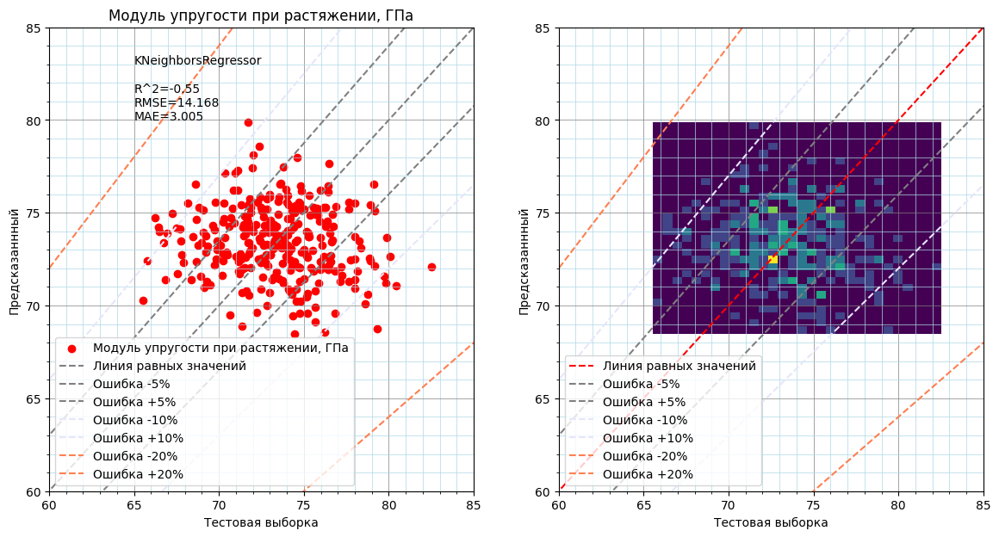

In [45]:
plot_data = True
    
if plot_data == True:
    model_data = models_performance_1st[4][6]
    show_model_performance(model_data,
                           model_data['y_test'],
                           model_data['y_pred'],
                           range_val = (60, 85),
                           color = 'red',
                           title = 'Модуль упругости при растяжении, ГПа')

# По тем же функциям что приготовили выше делаем расчет для второго показателя для нескольких моделей в этом случае наиболее оптимальный вариант достигается при 64 нейронах в скрытом слое

In [46]:
R2_SCORE_list = []
RMSE_list = []
MAE_list = []
name_list = []
models = []
models_performance_2nd = [name_list, R2_SCORE_list, RMSE_list, MAE_list, models]


models = ['MLPRegressor', 'KNeighborsRegressor', 'RandomForestRegressor']
neuron_models = [(64, 32),
                 (100, 50),
                 (200, 100),
                 (64),
                 (100),
                 (200),
                 (300)]


for model in models:
     if model  != 'MLPRegressor':
         model_data = train_and_validate_model(X2, y2, model_type=model, n_estimators=200)
         append_results(model_data, models_performance_2nd)
     else:
        for neuron_struct in neuron_models:
            model_data = train_and_validate_model(X2, y2, model_type=model, neuron_model = neuron_struct)
            append_results(model_data, models_performance_2nd)
            
print_results(models_performance_2nd)

C:\Users\wladg\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (7000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\wladg\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (7000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\wladg\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (7000) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\wladg\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (7000) reached and the optimization hasn't converged yet.
  warnings.warn(


name = MLPRegressor; neuron_struct = (64, 32); r2_score=-1.275; RMSE=523041.614; MAE=564.46
name = MLPRegressor; neuron_struct = (100, 50); r2_score=-1.356; RMSE=541644.75; MAE=589.959
name = MLPRegressor; neuron_struct = (200, 100); r2_score=-1.311; RMSE=531149.734; MAE=575.707
name = MLPRegressor; neuron_struct = 64; r2_score=-0.09; RMSE=250591.306; MAE=405.545
name = MLPRegressor; neuron_struct = 100; r2_score=-0.102; RMSE=253342.776; MAE=406.112
name = MLPRegressor; neuron_struct = 200; r2_score=-0.119; RMSE=257173.957; MAE=404.791
name = MLPRegressor; neuron_struct = 300; r2_score=-0.099; RMSE=252597.84; MAE=406.537
name = KNeighborsRegressor; neuron_struct = ; r2_score=-0.296; RMSE=297835.811; MAE=429.414
name = RandomForestRegressor; neuron_struct = ; r2_score=-0.019; RMSE=234309.111; MAE=385.056


# Визуализируем второй результат, тут дело обстоит еще хуже чем в первом случае, опять же все разлетается вокруг линии равных значений и на карте частот видно, что наибольшая плотность точек в центральной части. Но следует констатировать что модель плохо описывает данные

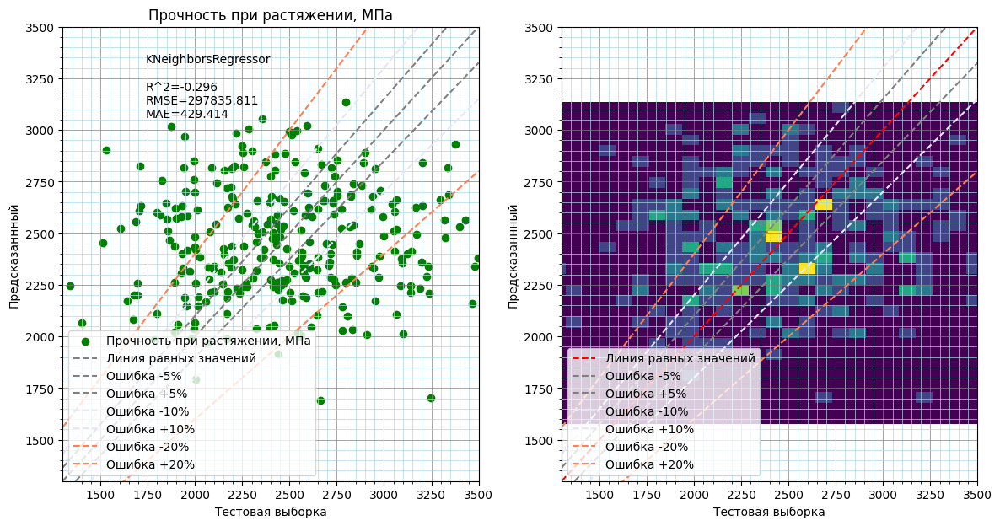

In [47]:
if plot_data == True:
    model_data = models_performance_2nd[4][7]
    show_model_performance(model_data,
                           model_data['y_test'],
                           model_data['y_pred'],
                           range_val = (1300, 3500),
                           color = 'green',
                           title = 'Прочность при растяжении, МПа')
else:
    pass

# Готовим входные данные все данные для консольного скрипта

In [48]:
text = ''

string = ''
for feature in features1:
    if string == '':
        string += str(feature)
    else:
        string += ';'+str(feature)
        
text += string+'\n'
    
for x in X1:
    string = ''
    for y in x:
        if string == '':
            string += str(y)
        else:
            string += ';'+str(y)
    text += string+'\n'
    
print(text)
    
file = './data_to_process.csv'

with open(file, 'w', encoding='utf-8') as f:
    f.write(text)

Шаг нашивки;Плотность нашивки;Соотношение матрица-наполнитель;Плотность, кг/м3;модуль упругости, ГПа;Количество отвердителя, м.%;Содержание эпоксидных групп,%_2;Температура вспышки, С_2;Поверхностная плотность, г/м2;Потребление смолы, г/м2;Угол нашивки 0;Угол нашивки 90
4.0;60.0;1.85714285714285;2030.0;738.736842105263;50.0;23.75;284.615384615384;210.0;220.0;1.0;0.0
5.0;47.0;1.85714285714285;2030.0;738.736842105263;129.0;21.25;300.0;210.0;220.0;1.0;0.0
5.0;57.0;2.77133105802047;2030.0;753.0;111.86;22.2678571428571;284.615384615384;210.0;220.0;1.0;0.0
5.0;60.0;2.7679180887372;2000.0;748.0;111.86;22.2678571428571;284.615384615384;210.0;220.0;1.0;0.0
5.0;70.0;2.56962025316455;1910.0;807.0;111.86;22.2678571428571;284.615384615384;210.0;220.0;1.0;0.0
7.0;47.0;2.56147540983606;1900.0;535.0;111.86;22.2678571428571;284.615384615384;380.0;120.0;1.0;0.0
7.0;57.0;3.55701754385964;1930.0;889.0;129.0;21.25;300.0;380.0;120.0;1.0;0.0
7.0;60.0;3.53233830845771;2100.0;1421.0;129.0;21.25;300.0;1010.0;30

# Имитируя работу скрипта подгружаем данные независимых 12 переменных и вытаскиваем нужную модель из обученных, проводим расчет, затем выводим результат

In [49]:
df = pd.read_csv(file, sep=';', engine='python')
model_data = models_performance_1st[4][6]
X = df.values

In [50]:
X = model_data['scaler'].transform(X)
y_pred = model_data['model'].predict(X)

for y in y_pred:
    print(y)

72.04885101445376
74.10063128895958
70.6824804427945
70.31395894649556
73.04850729084994
73.43240594628669
73.0131521626446
71.3819905751651
70.91694908872203
72.49305867258643
74.85727038854414
74.08326154198427
73.85245849685246
74.34331316924384
71.47470266280168
72.10356981683329
71.44745415609174
76.07708305476586
73.10068356989264
72.8629969277963
75.06231856667777
71.4595043795343
73.38702816540587
72.09863331635604
70.9914533254212
74.4951336811092
74.00554186099531
70.7716989481068
77.14619592037873
71.678645781404
74.13520172830903
74.13520172830903
73.21984037843663
74.074595535471
73.50715808418403
73.59521923363035
77.66491307060994
74.99070710470833
68.23441841565302
73.4555234312578
73.36402562601192
71.89409776043544
73.66561793397706
72.8156841939949
76.18500331943727
75.47336594316447
71.95174957732786
72.59960146515185
73.61370808135086
71.83034175644484
69.2032943279966
73.76595813104257
73.81951181459483
76.64703770068591
71.9064417853599
77.47485136590787
71.73354